In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import random
import scipy
import scanpy as sc
import scvi
import os
import sklearn.cluster as cluster
import scdrs

sc.set_figure_params(figsize=(4, 4))

Global seed set to 0


## Load and tidy EB data

In [ ]:
eb_normalized = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.h5ad")

For a fair comparison to the fetal cell atlas, where we're calibrating our expectations for how gene modules perform, we'll subsample to 5K cells per cell type and I'm going to remove unassigned cells

In [ ]:
celltype_labels = pd.read_csv("/project2/gilad/jpopp/ebQTL/data/fca/cellid_labels.tsv", sep="\t").set_index("cell")
celltype_labels = celltype_labels[celltype_labels['value'] != 'unassigned']

In [14]:
grouped = celltype_labels.groupby('value')

# Define an empty dataframe to store the subsampled data
subsampled_labs = pd.DataFrame()

# Loop over the groups
for name, group in grouped:

    # If the number of observations in the group is less than or equal to the maximum,
    # add all of the observations to the subsampled dataframe
    if len(group) <= 5000:
        subsampled_labs = pd.concat([subsampled_labs, group])
    else:
        # If the number of observations in the group is greater than the maximum,
        # randomly sample the maximum number of observations from the group
        subsampled_labs = pd.concat([subsampled_labs, group.sample(n=5000)])

Now I'm also going to remove the cell types with fewer than 500 cells from this analysis

In [22]:
rare_types = ['Endocardial cells', 'Adrenocortical cells', 'Lymphatic endothelial cells', 'STC2_TLX1 positive cells']
subsampled_labs = subsampled_labs[~subsampled_labs['value'].isin(rare_types)]

In [28]:
eb_sub = eb_normalized[subsampled_labs.index]
eb_sub.obs['celltype'] = subsampled_labs['value']
eb_sub.X = eb_sub.layers['log1pPF']

/tmp/jobs/26060262/ipykernel_9003/1255663053.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  eb_sub.obs['celltype'] = subsampled_labs['value']


In [29]:
eb_sub.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.celltype_subset.h5ad")

In [29]:
eb_sub.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.celltype_subset.h5ad")

In [30]:
eb_sub.obs[['celltype']].value_counts()

celltype                                 
Acinar cells                                 5000
Hepatoblasts                                 5000
Stromal cells                                5000
Squamous epithelial cells                    5000
Skeletal muscle cells                        5000
Retinal cells                                5000
PNS neurons                                  5000
PNS glia                                     5000
Neuroendocrine cells                         5000
Metanephric cells                            5000
Mesangial cells                              5000
Ciliated epithelial cells                    5000
CNS glia                                     5000
Erythroblasts                                5000
CNS neurons                                  5000
Ductal cells                                 5000
Cardiomyocytes                               5000
Ureteric bud cells                           4417
Goblet cells                                 3584
Vascular

In [2]:
eb_sub = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.celltype_subset.h5ad")

## Load and tidy FCA data

In [3]:
fca = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/fca/counts.subsampled.mca_pca_fromhvgs.h5ad")

In [78]:
fca

AnnData object with n_obs × n_vars = 142660 × 17080
    obs: 'sample', 'Exon_reads', 'Intron_reads', 'All_reads', 'RT_group', 'Organ', 'Fetus_id', 'Development_day', 'Sex', 'Batch', 'Main_cluster_umap_1', 'Main_cluster_umap_2', 'Main_cluster_name', 'Assay', 'Organ_cell_lineage', 'Experiment_batch', 'celltype', 'sizeFactor'
    uns: 'X_name', 'SCDRS_PARAM'
    obsm: 'MCA', 'PCA'
    layers: 'counts'

## scDRS Analysis

In [4]:
scdrs.preprocess(eb_sub, adj_prop='celltype')

In [6]:
eb_sub.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.celltype_subset.scdrs_preprocessed.h5ad")

In [7]:
scdrs.preprocess(fca, adj_prop='celltype')

In [8]:
fca.write_h5ad("/project2/gilad/jpopp/ebQTL/data/fca/counts.subsampled.mca_pca_fromhvgs.scdrs_preprocessed.h5ad")

In [6]:
eb_sub = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.celltype_subset.scdrs_preprocessed.h5ad")
fca = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/fca/counts.subsampled.mca_pca_fromhvgs.scdrs_preprocessed.h5ad")

In [10]:
go_mf_gs = scdrs.util.load_gs("/project2/gilad/jpopp/ebQTL/data/gene_sets/c5.go.mf.Hs.symbols.gs")
go_bp_gs = scdrs.util.load_gs("/project2/gilad/jpopp/ebQTL/data/gene_sets/c5.go.bp.Hs.symbols.gs")

## Color Mapping

In [21]:
fca_types = list(fca.obs.celltype.cat.categories)
fca_types

['Acinar cells',
 'Adrenocortical cells',
 'Bronchiolar and alveolar epithelial cells',
 'CNS glia',
 'CNS neurons',
 'Cardiomyocytes',
 'Ciliated epithelial cells',
 'Ductal cells',
 'Endocardial cells',
 'Epicardial fat cells',
 'Erythroblasts',
 'Goblet cells',
 'Hepatoblasts',
 'Intestinal epithelial cells',
 'Lymphatic endothelial cells',
 'Lymphoid cells',
 'Megakaryocytes',
 'Mesangial cells',
 'Mesothelial cells',
 'Metanephric cells',
 'Neuroendocrine cells',
 'PNS glia',
 'PNS neurons',
 'Parietal and chief cells',
 'Retinal cells',
 'STC2_TLX1 positive cells',
 'Skeletal muscle cells',
 'Smooth muscle cells',
 'Squamous epithelial cells',
 'Stellate cells',
 'Stromal cells',
 'Ureteric bud cells',
 'Vascular endothelial cells']

In [26]:
full_palette = sns.color_palette(n_colors=len(fca_types))

In [58]:
eb_types = list(eb_sub.obs.celltype.cat.categories)
eb_palette = sns.color_palette([full_palette[fca_types.index(t)] for t in eb_types])

## GO BP - Hepaticobiliary System Development

### EBs

In [53]:
hbs_gene_list = go_bp_gs['GOBP_HEPATICOBILIARY_SYSTEM_DEVELOPMENT'][0]

In [54]:
hbs_res = scdrs.score_cell(eb_sub, hbs_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [03:03<00:00,  1.84s/it]


In [55]:
eb_sub.obs['hbs_module_score'] = hbs_res['norm_score']

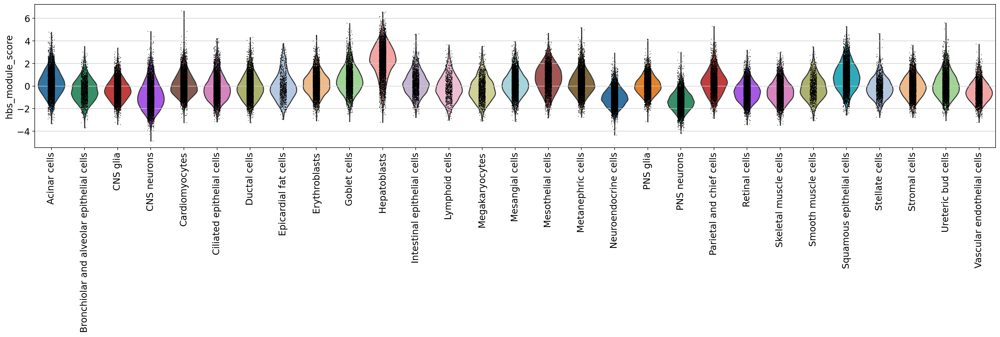

In [63]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb_sub, keys='hbs_module_score', groupby='celltype', rotation=90, palette=eb_palette)

### FCA

In [59]:
hbs_res_fca = scdrs.score_cell(fca, hbs_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [00:22<00:00,  4.48it/s]


In [60]:
fca.obs['hbs_module_score'] = hbs_res_fca['norm_score']

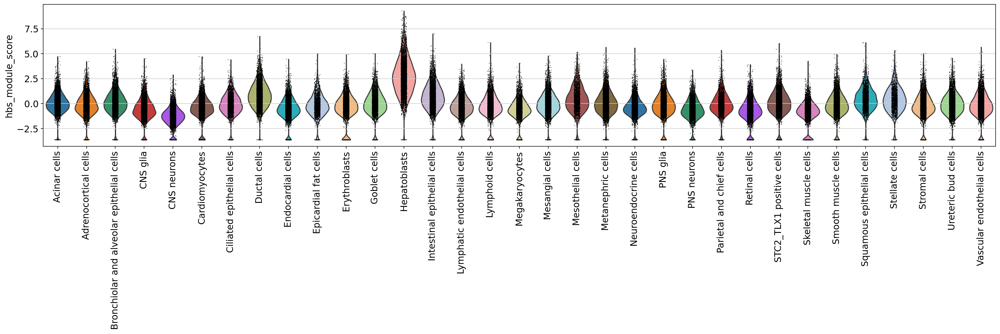

In [62]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(fca, keys='hbs_module_score', groupby='celltype', rotation=90, palette=full_palette)

## GO BP - Cardiac Cell Development

### EBs

In [64]:
cardiacdev_gene_list = go_bp_gs['GOBP_CARDIAC_CELL_DEVELOPMENT'][0]

In [65]:
cardiacdev_res = scdrs.score_cell(eb_sub, cardiacdev_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [02:47<00:00,  1.68s/it]


In [66]:
eb_sub.obs['cardiacdev_module_score'] = cardiacdev_res['norm_score']

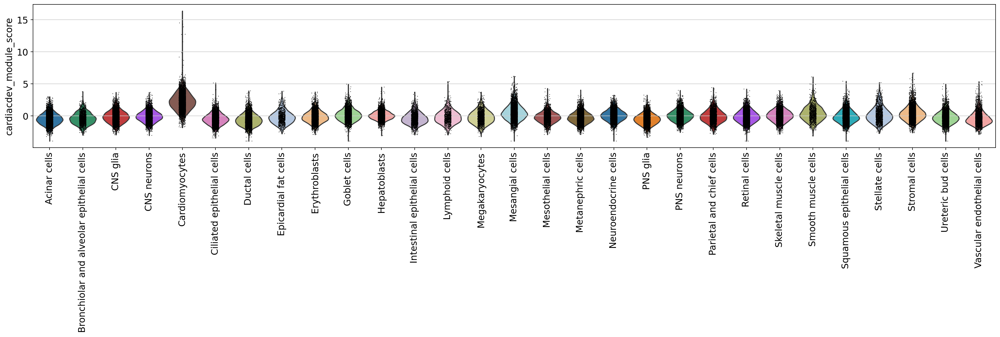

In [67]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb_sub, keys='cardiacdev_module_score', groupby='celltype', rotation=90, palette=eb_palette)

### FCA

In [68]:
cardiacdev_res_fca = scdrs.score_cell(fca, cardiacdev_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


In [69]:
fca.obs['cardiacdev_module_score'] = cardiacdev_res_fca['norm_score']

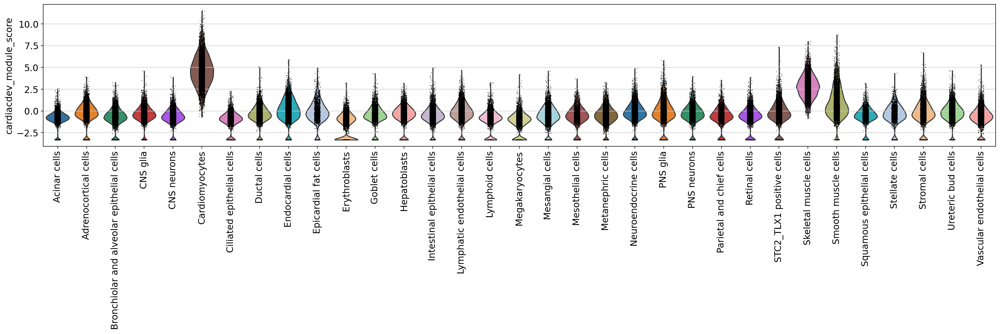

In [70]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(fca, keys='cardiacdev_module_score', groupby='celltype', rotation=90, palette=full_palette)

## GO BP - Retina Development

### EBs

In [78]:
retina_gene_list = go_bp_gs['GOBP_NEURAL_RETINA_DEVELOPMENT'][0]

In [79]:
retina_res = scdrs.score_cell(eb_sub, retina_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [02:47<00:00,  1.68s/it]


In [80]:
eb_sub.obs['retina_module_score'] = retina_res['norm_score']

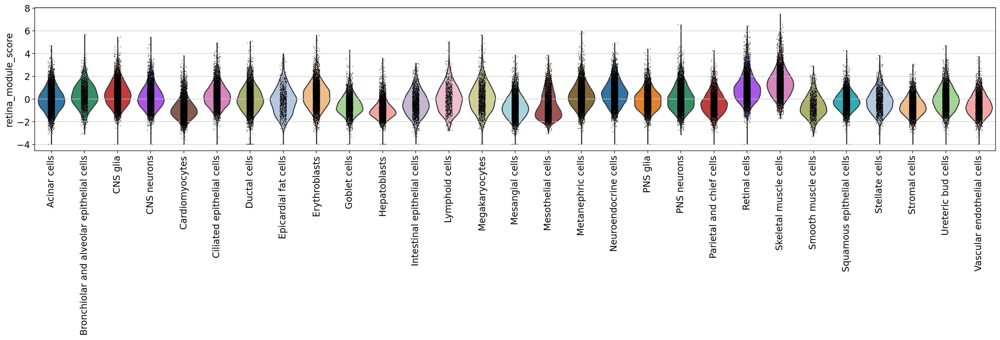

In [81]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb_sub, keys='retina_module_score', groupby='celltype', rotation=90, palette=eb_palette)

### FCA

In [82]:
retina_res_fca = scdrs.score_cell(fca, retina_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [00:18<00:00,  5.49it/s]


In [83]:
fca.obs['retina_module_score'] = retina_res_fca['norm_score']

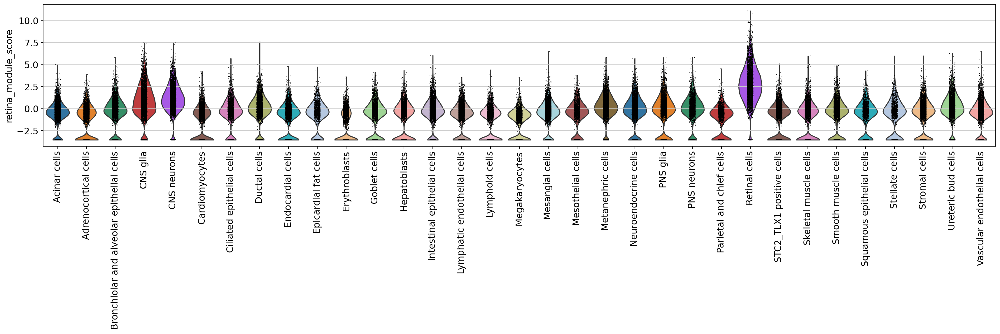

In [84]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(fca, keys='retina_module_score', groupby='celltype', rotation=90, palette=full_palette)

## GO BP - Epithelial Cell Differentiation

### EBs

In [88]:
epithelial_gene_list = go_bp_gs['GOBP_REGULATION_OF_EPITHELIAL_CELL_DIFFERENTIATION'][0]

In [89]:
epithelial_res = scdrs.score_cell(eb_sub, epithelial_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [02:58<00:00,  1.78s/it]


In [90]:
eb_sub.obs['epithelial_module_score'] = epithelial_res['norm_score']

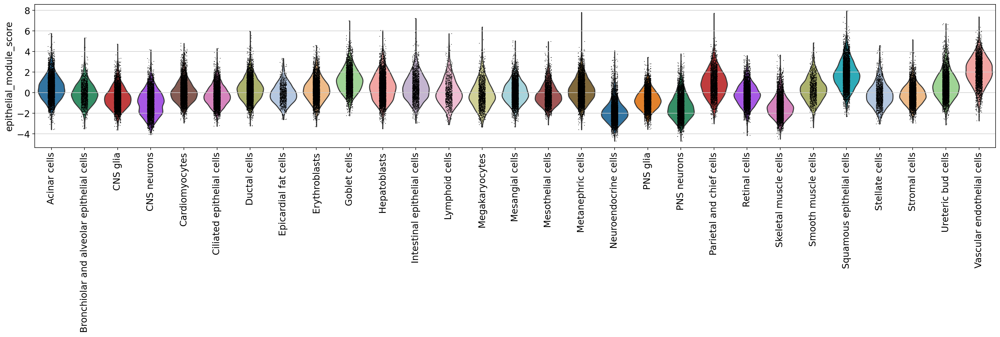

In [91]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb_sub, keys='epithelial_module_score', groupby='celltype', rotation=90, palette=eb_palette)

### FCA

In [92]:
epithelial_res_fca = scdrs.score_cell(fca, epithelial_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


In [93]:
fca.obs['epithelial_module_score'] = epithelial_res_fca['norm_score']

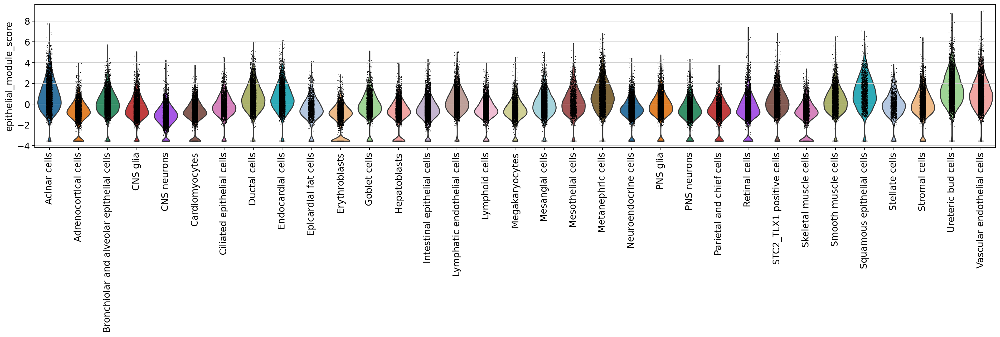

In [94]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(fca, keys='epithelial_module_score', groupby='celltype', rotation=90, palette=full_palette)

## GO BP Neuroepithelial Cell Differentiation

### EBs

In [98]:
neuroepithelial_gene_list = go_bp_gs['GOBP_NEUROEPITHELIAL_CELL_DIFFERENTIATION'][0]

In [99]:
neuroepithelial_res = scdrs.score_cell(eb_sub, neuroepithelial_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [02:36<00:00,  1.56s/it]


In [100]:
eb_sub.obs['neuroepithelial_module_score'] = neuroepithelial_res['norm_score']

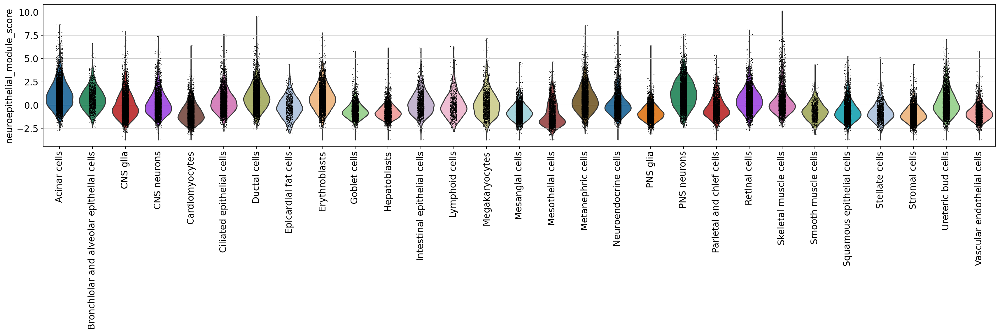

In [102]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb_sub, keys='neuroepithelial_module_score', groupby='celltype', rotation=90, palette=eb_palette)

### FCA

In [101]:
neuroepithelial_res_fca = scdrs.score_cell(fca, neuroepithelial_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [00:16<00:00,  6.00it/s]


In [103]:
fca.obs['neuroepithelial_module_score'] = neuroepithelial_res_fca['norm_score']

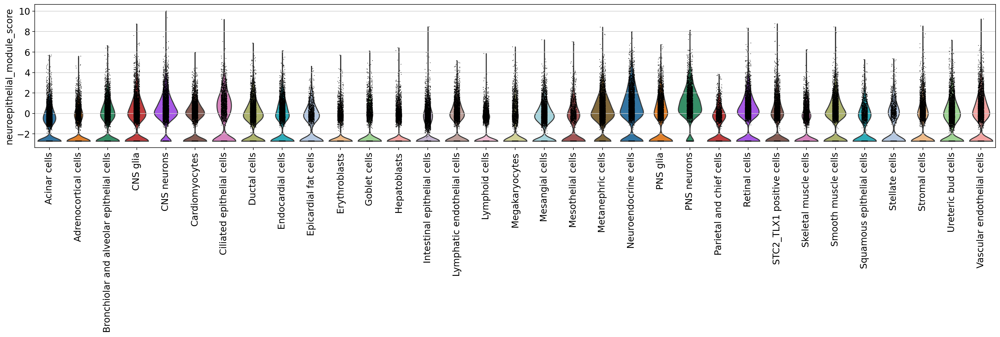

In [104]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(fca, keys='neuroepithelial_module_score', groupby='celltype', rotation=90, palette=full_palette)

## GO BP Kidney Cell Differentiation

### EBs

In [105]:
kidney_gene_list = go_bp_gs['GOBP_CELL_DIFFERENTIATION_INVOLVED_IN_KIDNEY_DEVELOPMENT'][0]

In [106]:
kidney_res = scdrs.score_cell(eb_sub, kidney_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [02:41<00:00,  1.61s/it]


In [107]:
eb_sub.obs['kidney_module_score'] = kidney_res['norm_score']

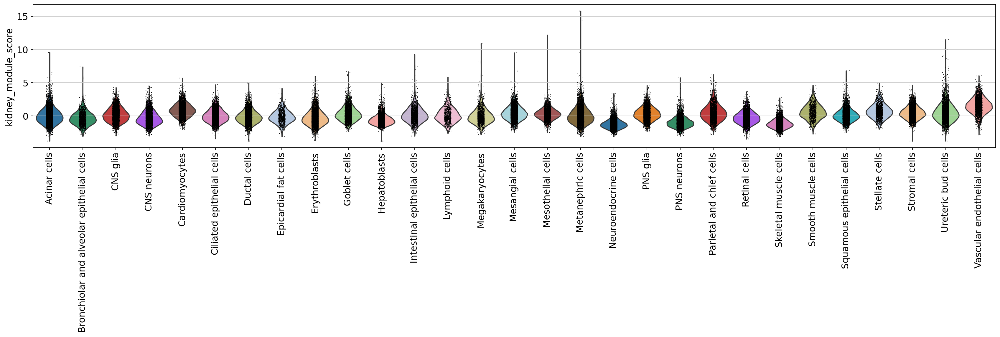

In [108]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb_sub, keys='kidney_module_score', groupby='celltype', rotation=90, palette=eb_palette)

### FCA

In [110]:
kidney_res_fca = scdrs.score_cell(fca, kidney_gene_list, n_ctrl=100)

Computing control scores: 100%|██████████| 100/100 [00:20<00:00,  4.98it/s]


In [111]:
fca.obs['kidney_module_score'] = kidney_res_fca['norm_score']

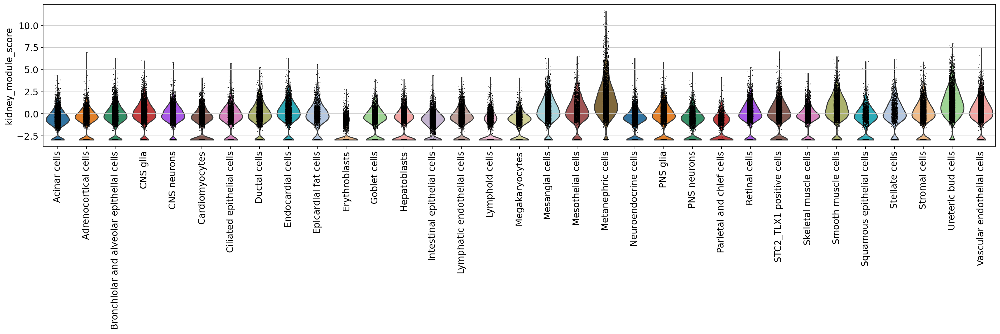

In [112]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(fca, keys='kidney_module_score', groupby='celltype', rotation=90, palette=full_palette)

## Quick Test

In [95]:
quick_list = go_bp_gs['GOBP_NEUROEP_DIFFERENTIATION'][0]
quick_res = scdrs.score_cell(fca, quick_list, n_ctrl=50)

Computing control scores: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]


In [96]:
fca.obs['quick_module_score'] = quick_res['norm_score']

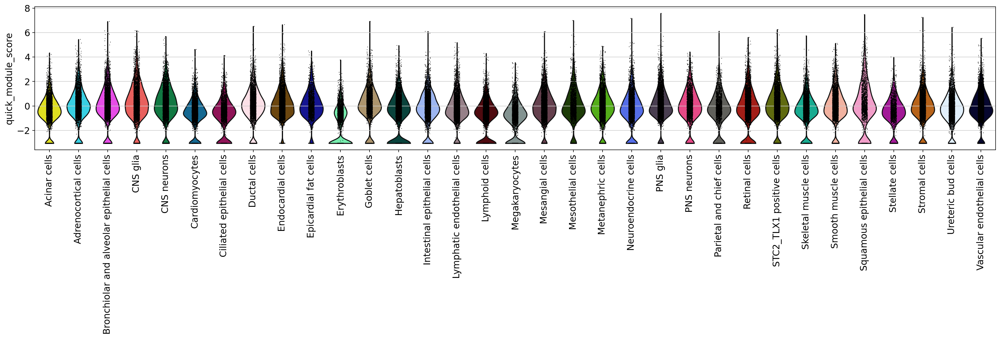

In [97]:
sc.pl.violin(fca, keys='quick_module_score', groupby='celltype', rotation=90)

## Module Co-Expression

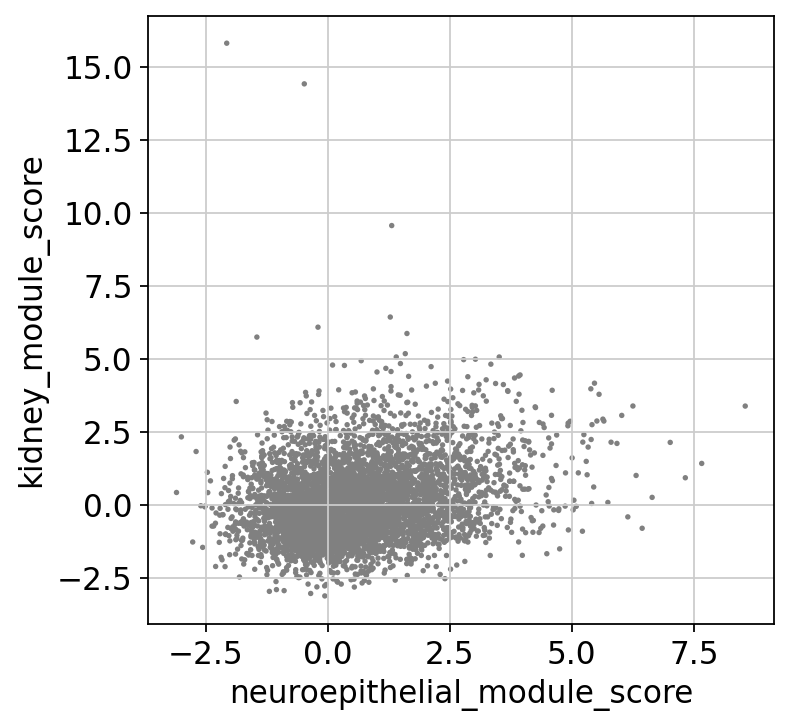

In [115]:
sc.set_figure_params(figsize=(5, 5))
eb_metanephric = eb_sub[eb_sub.obs['celltype'] == 'Metanephric cells']
sc.pl.scatter(eb_metanephric, 'neuroepithelial_module_score', 'kidney_module_score')

In [120]:
eb_metanephric.obs[['neuroepithelial_module_score', 'kidney_module_score']].corr()

,neuroepithelial_module_score,kidney_module_score
neuroepithelial_module_score,1.000000,0.253891
kidney_module_score,0.253891,1.000000


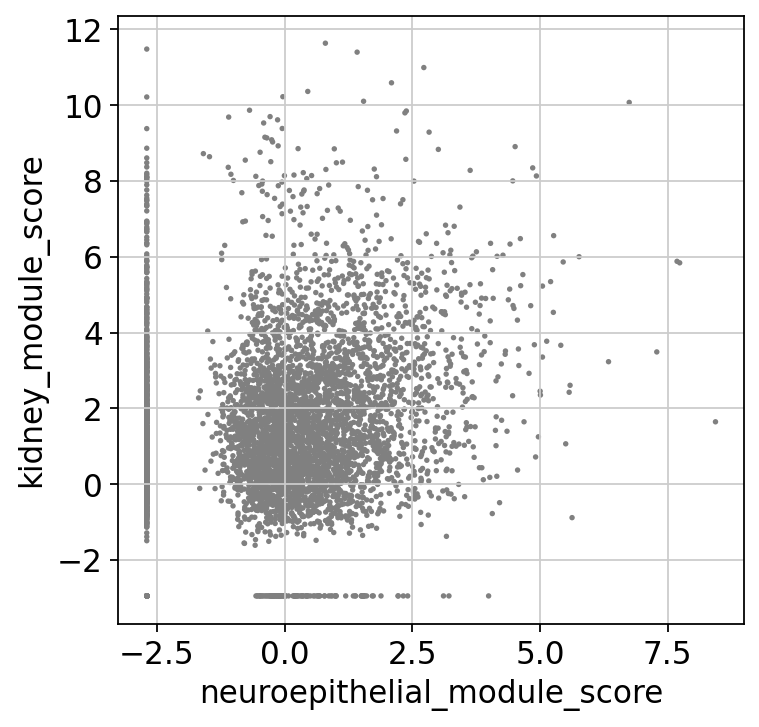

In [116]:
fca_metanephric = fca[fca.obs['celltype'] == 'Metanephric cells']
sc.pl.scatter(fca_metanephric, 'neuroepithelial_module_score', 'kidney_module_score')

In [119]:
fca_metanephric.obs[['neuroepithelial_module_score', 'kidney_module_score']].corr()

,neuroepithelial_module_score,kidney_module_score
neuroepithelial_module_score,1.000000,0.181388
kidney_module_score,0.181388,1.000000


Load FCA data with MCA embedding and cell type labels - note that X is log counts

In [3]:
fca = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/fca/counts.subsampled.lognorm.mca.h5ad")

In [5]:
fca.obs['celltype'].value_counts()

Acinar cells                                 5000
Lymphatic endothelial cells                  5000
Ureteric bud cells                           5000
Stromal cells                                5000
Smooth muscle cells                          5000
Skeletal muscle cells                        5000
Retinal cells                                5000
PNS glia                                     5000
Neuroendocrine cells                         5000
Metanephric cells                            5000
Mesangial cells                              5000
Adrenocortical cells                         5000
Lymphoid cells                               5000
Vascular endothelial cells                   5000
Intestinal epithelial cells                  5000
Erythroblasts                                5000
Bronchiolar and alveolar epithelial cells    5000
CNS glia                                     5000
Endocardial cells                            5000
CNS neurons                                  5000


Load EB data with MCA embedding and cell type labels

In [2]:
eb = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/eb_pflog1ppfnorm.fca_hvg.h5ad")

In [12]:
eb

AnnData object with n_obs × n_vars = 909536 × 2017
    obs: 'sample_id', 'Collection.Date', 'Lane', 'Sample.ID', 'cDNA.amp.cycles', 'cDNA.total.yield', 'library.prep.batch', 'Sequencing.batch', 'col.group', 'donor_id', 'prob_max', 'prob_doublet', 'n_vars', 'best_singlet', 'best_doublet', 'doublet_logLikRatio', 'Line.True', 'Line.StockLabel', 'contaminated', 'swapped', 'Feeder.passage', 'Feeder.Free.passage', 'sex', 'Formation.replicate', 'collection.replicate', 'formation.date', 'visual.confluence', 'total.cells.per.lane..correct.', 'X..Viable..based.on.average.of.two.counts.', 'days.maintained.in.LD.prior.to.formation', 'who.dissociated.the.lines.for.formation', 'cell.counter.correction', 'comments', 'collection.date', 'collection.group.label', 'EB.appearance.notes', 'dissociated.by.', 'approx..time.in.accumax..in.minutes.', 'leiden_coarse', 'sizeFactor', 'scranGroup', 'scranCluster'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
  

In [19]:
mca_embedding = pd.read_csv("/project2/gilad/jpopp/ebQTL/data/fca/eb_mca_embedding.tsv", sep="\t").set_index('cell').to_numpy()

In [63]:
table_prefix="data/module_scoring/"
g = "GO_BP_EX"

In [3]:
eb_celltype = "/project2/gilad/jpopp/ebQTL/data/fca/eb_cellid_labels.tsv"

In [4]:
celltypes = pd.read_csv(eb_celltype, sep="\t").set_index('cell').reindex(eb.obs_names)
eb.obs['celltype'] = celltypes['value']

In [49]:
type_counts = pd.DataFrame(celltypes.value_counts())

In [61]:
type_counts

,0
value,
unassigned,258407
Retinal cells,120922
CNS neurons,89830
PNS glia,78628
CNS glia,49034
Stromal cells,47379
Metanephric cells,45261
Ciliated epithelial cells,43101
Ductal cells,40274


In [24]:
um = celltypes.value_counts()[celltypes.value_counts() < 1000]

MultiIndex([(                 'Parietal and chief cells',),
            (                           'Lymphoid cells',),
            ('Bronchiolar and alveolar epithelial cells',),
            (                        'Endocardial cells',),
            (              'Lymphatic endothelial cells',),
            (              'Intestinal epithelial cells',),
            (                 'STC2_TLX1 positive cells',)],
           names=['value'])

In [29]:
rare_types = list(celltypes[celltypes.value_counts('value') < 1000]).index

/tmp/jobs/26615031/ipykernel_12025/1891121032.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rare_types = list(celltypes[celltypes.value_counts('value') < 1000]).index


IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match).

In [ ]:
rare_types

In [33]:
test = eb[eb.obs['celltype'] != 'unassigned'].copy()

In [34]:
test

AnnData object with n_obs × n_vars = 651129 × 2017
    obs: 'sample_id', 'Collection.Date', 'Lane', 'Sample.ID', 'cDNA.amp.cycles', 'cDNA.total.yield', 'library.prep.batch', 'Sequencing.batch', 'col.group', 'donor_id', 'prob_max', 'prob_doublet', 'n_vars', 'best_singlet', 'best_doublet', 'doublet_logLikRatio', 'Line.True', 'Line.StockLabel', 'contaminated', 'swapped', 'Feeder.passage', 'Feeder.Free.passage', 'sex', 'Formation.replicate', 'collection.replicate', 'formation.date', 'visual.confluence', 'total.cells.per.lane..correct.', 'X..Viable..based.on.average.of.two.counts.', 'days.maintained.in.LD.prior.to.formation', 'who.dissociated.the.lines.for.formation', 'cell.counter.correction', 'comments', 'collection.date', 'collection.group.label', 'EB.appearance.notes', 'dissociated.by.', 'approx..time.in.accumax..in.minutes.', 'leiden_coarse', 'sizeFactor', 'scranGroup', 'scranCluster', 'celltype'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersi

In [60]:
1 < 3 < 5

True

In [36]:
umap_embedding = np.loadtxt("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/eb_pflog1ppfnorm.hvg.umap_embedding.txt")

In [37]:
eb.obsm['X_umap'] = umap_embedding

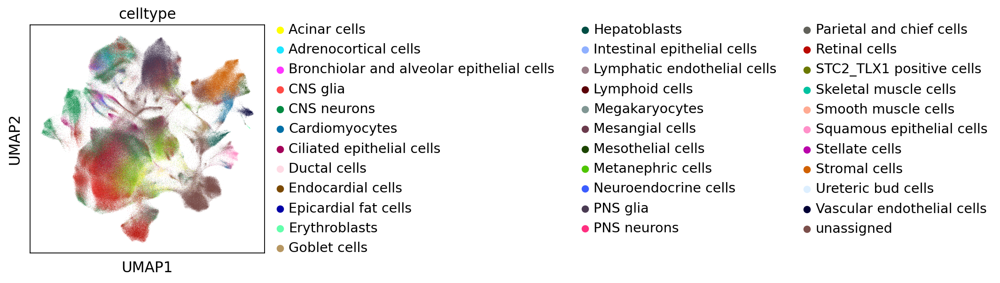

In [40]:
sc.pl.umap(eb, color='celltype')

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


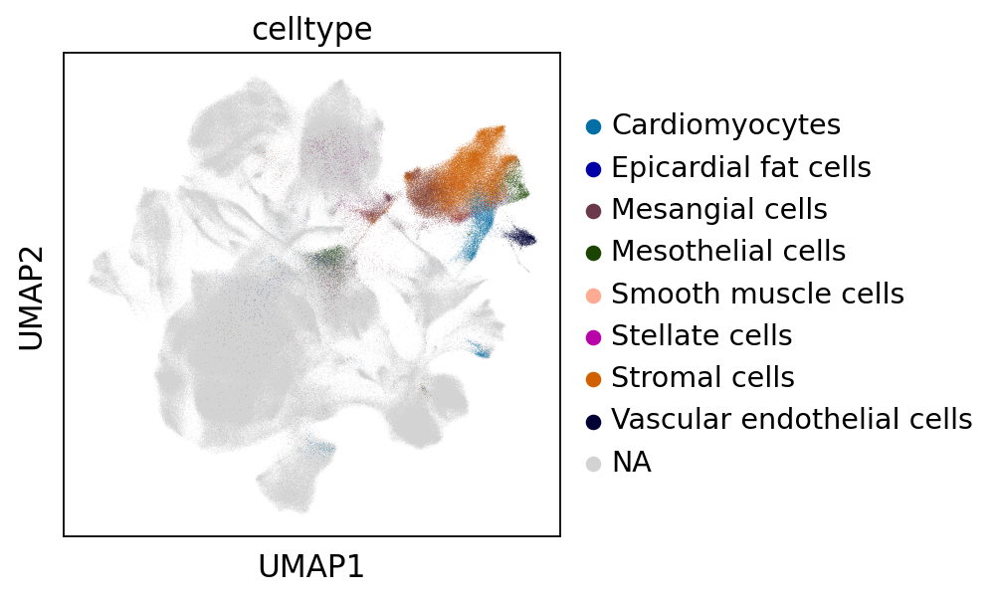

In [49]:
sc.pl.umap(eb, color='celltype', groups=['Vascular endothelial cells', 'Stromal cells', 'Mesangial cells', 'Mesothelial cells', 'Epicardial fat cells', 'Cardiomyocytes', 'Smooth muscle cells', 'Stellate cells'])

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


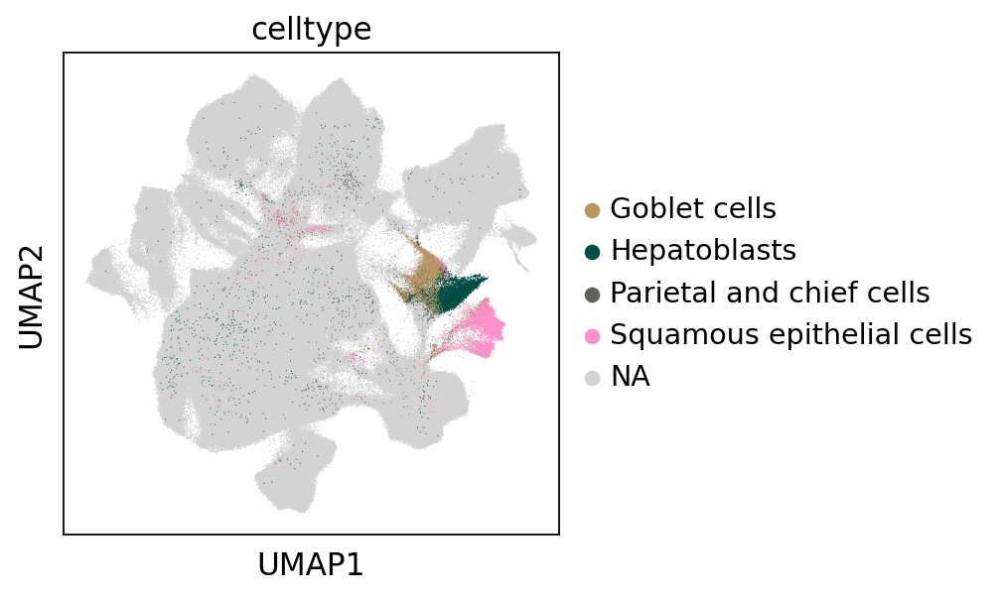

In [47]:
sc.pl.umap(eb, color='celltype', groups=['Hepatoblasts', 'Parietal and chief cells', 'Goblet cells', 'Squamous epithelial cells'], size=1.0)

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


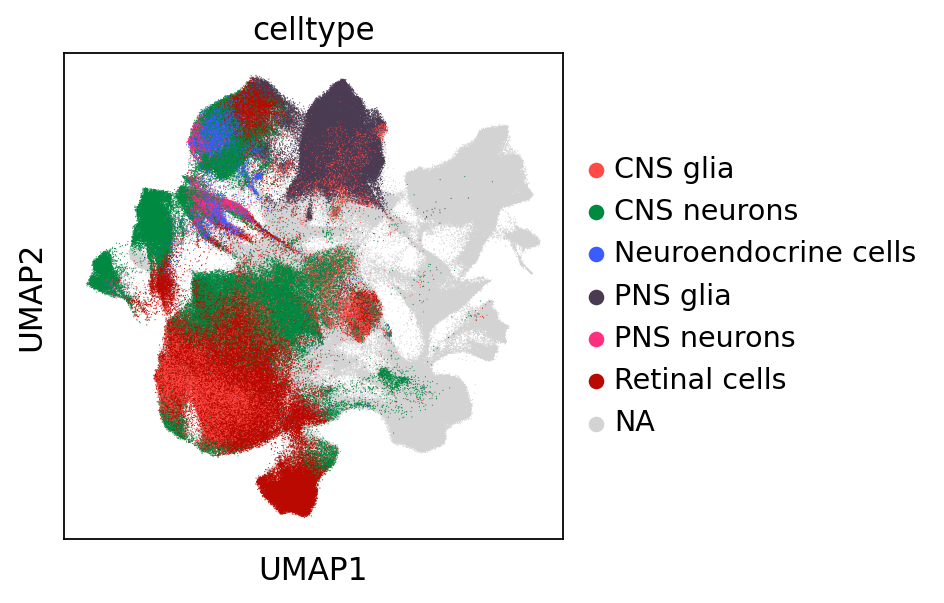

In [50]:
sc.pl.umap(eb, color='celltype', groups=['PNS neurons', 'CNS neurons', 'PNS glia', 'CNS glia', 'Neuroendocrine cells', 'Retinal cells'], size=1.0)

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


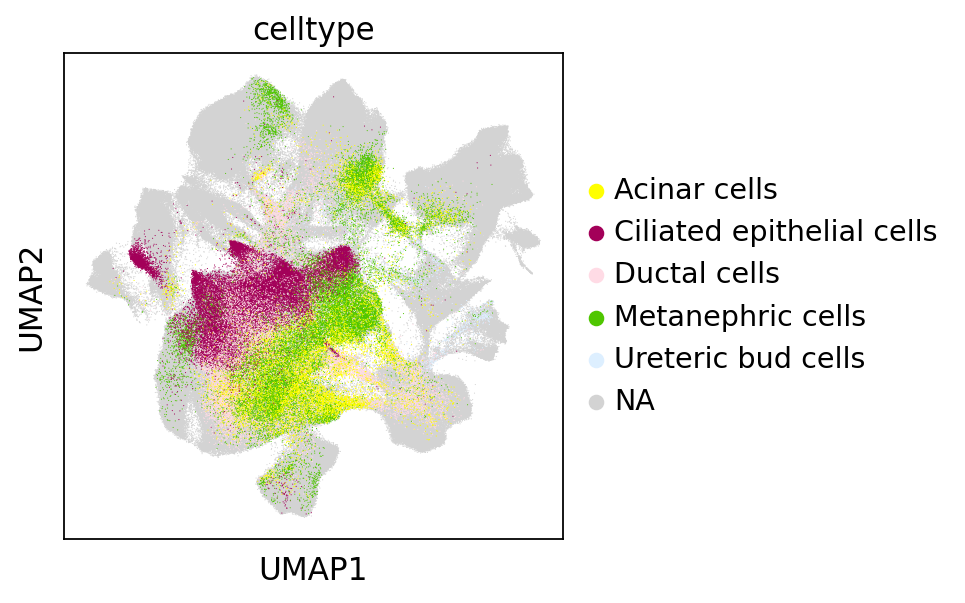

In [57]:
sc.pl.umap(eb, color='celltype', groups=['Acinar cells', 'Ductal cells', 'Metanephric cells', 
                                         'Ciliated epithelial cells', 'Ureteric bud cells'], size=1.0)

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


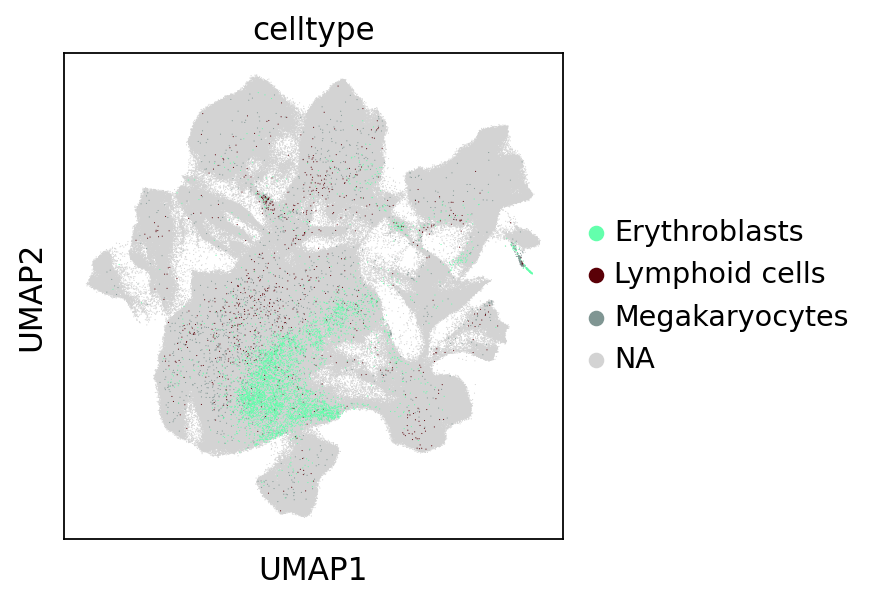

In [54]:
sc.pl.umap(eb, color='celltype', groups=['Erythroblasts', 'Megakaryocytes', 'Lymphoid cells'], size=1.0)

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


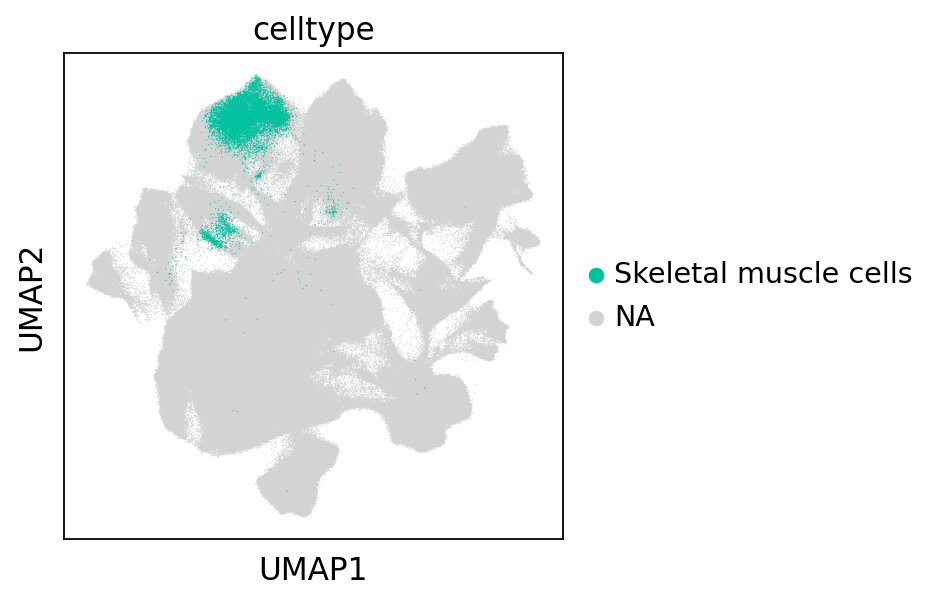

In [52]:
sc.pl.umap(eb, color='celltype', groups=['Skeletal muscle cells'], size=1.0)

In [59]:
eb.obs.columns

Index(['sample_id', 'Collection.Date', 'Lane', 'Sample.ID', 'cDNA.amp.cycles',
       'cDNA.total.yield', 'library.prep.batch', 'Sequencing.batch',
       'col.group', 'donor_id', 'prob_max', 'prob_doublet', 'n_vars',
       'best_singlet', 'best_doublet', 'doublet_logLikRatio', 'Line.True',
       'Line.StockLabel', 'contaminated', 'swapped', 'Feeder.passage',
       'Feeder.Free.passage', 'sex', 'Formation.replicate',
       'collection.replicate', 'formation.date', 'visual.confluence',
       'total.cells.per.lane..correct.',
       'X..Viable..based.on.average.of.two.counts.',
       'days.maintained.in.LD.prior.to.formation',
       'who.dissociated.the.lines.for.formation', 'cell.counter.correction',
       'comments', 'collection.date', 'collection.group.label',
       'EB.appearance.notes', 'dissociated.by.',
       'approx..time.in.accumax..in.minutes.', 'leiden_coarse', 'sizeFactor',
       'scranGroup', 'scranCluster', 'celltype'],
      dtype='object')

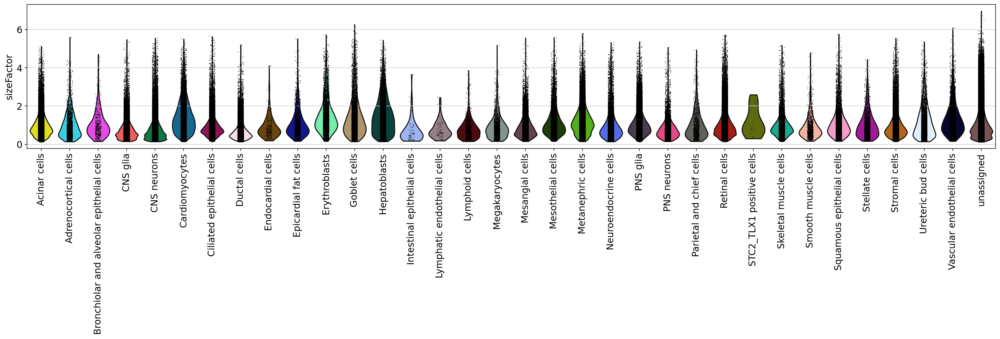

In [62]:
sc.set_figure_params(figsize=(20, 4))
sc.pl.violin(eb, 'sizeFactor', groupby='celltype', rotation=90)

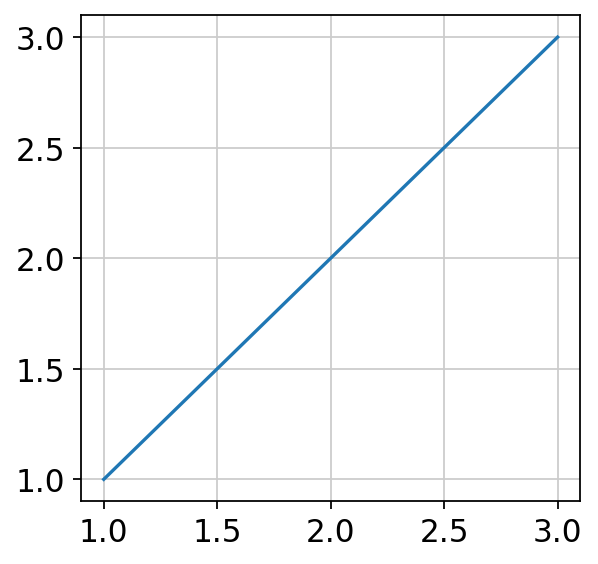

In [67]:
x = [1, 2, 3]
y = [1, 2, 3]
plt.plot(x, y)
plt.savefig("/project2/gilad/jpopp/ebQTL/temp/test2.png")